In [1]:
import os

os.chdir("/root/dev/DMTet_Models/")
os.getcwd()

'/root/dev/DMTet_Models'

In [2]:
import torch

torch.cuda.set_device(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
!gpustat

aa4173e0a5f2                Mon May  6 19:46:01 2024  535.129.03
[0] NVIDIA GeForce RTX 4090 | 25°C,   0 % |   725 / 24564 MB |
[1] NVIDIA GeForce RTX 4090 | 28°C,   0 % |     5 / 24564 MB |
[2] NVIDIA GeForce RTX 4090 | 45°C,  55 % | 12849 / 24564 MB |
[3] NVIDIA GeForce RTX 4090 | 47°C,  60 % | 12877 / 24564 MB |
[4] NVIDIA GeForce RTX 4090 | 53°C,  99 % | 20130 / 24564 MB |
[5] NVIDIA GeForce RTX 4090 | 49°C,  96 % | 13446 / 24564 MB |


# Dataset with Fitted DMTets

In [4]:
from easydict import EasyDict
#####
dmtet_grid = 64
mesh_scale = 1.1
geometry_kwargs = EasyDict({
    "iter": 5000,
    "sdf_regularizer": 0.2,
})
first_stage_deform = 2.0
second_stage_deform = 3.0

#####
dmtet_grid = 128
first_stage_deform = 0.45
second_stage_deform = 1.5

## Initial Vertices

In [5]:
!ls /root/dev/DMTet_Models/MeshDiffusion/nvdiffrec/data_/tets

128_tets_cropped.npz  README.md     generate_tets.py
64_tets_cropped.npz   crop_tets.py


In [6]:
import numpy as np

tet_init = np.load("/root/dev/DMTet_Models/MeshDiffusion/nvdiffrec/data_/tets/128_tets_cropped.npz") #####
verts = torch.tensor(tet_init["vertices"], dtype=torch.float32) * mesh_scale
indices = torch.tensor(tet_init["indices"], dtype=torch.long)

## Geometries

- first: Optimized geometry
- second: Finetuned geometry (only deformation)

In [7]:
# mask
!ls /root/dev/DMTet_Models/MeshDiffusion/data_

get_tet_mask.py  grid_mask_128.pt  grid_mask_64.pt  tets_to_3dgrid.py


In [62]:
# res: 64
!ls /root/dataset_sj/DMTet/res_64/chair

tets  tets_pre	val_viz


In [63]:
# res: 128
!ls /root/dataset_sj/DMTet/res_128/

airplane  car  chair  rifle  table


In [10]:
res = 64
# mask_path = "/root/dev/DMTet_Models/MeshDiffusion/data_/grid_mask_64.pt"
tet_pre_path = "/root/dataset_sj/DMTet/res_128/chair/tets_pre/dmt_dict_00000.pt" #####
tet_path = "/root/dataset_sj/DMTet/res_128/chair/tets/dmt_dict_00000.pt" #####

In [11]:
import torch

tet_pre = torch.load(tet_pre_path, map_location="cpu")
tet = torch.load(tet_path, map_location="cpu")
for key in tet.keys():
    print(key, tet[key].shape)
    print("min: ", tet[key].min())
    print("max: ", tet[key].max())
    print()
print(tet["sdf"].unique())
print(len(tet["deform"].unique()))
print(len(tet["deform_unmasked"].unique()))

sdf torch.Size([253024])
min:  tensor(-1.)
max:  tensor(1.)

deform torch.Size([253024, 3])
min:  tensor(-0.9900)
max:  tensor(0.9900)

deform_unmasked torch.Size([253024, 3])
min:  tensor(-0.9900)
max:  tensor(0.9900)

tensor([-1.,  1.])
33662
513368


In [12]:
# Vertices which has deformation value(>0) at least one coords
# res64: (20711, 3)
# res128: (158701, 3)
tet["deform_unmasked"][torch.any(tet["deform_unmasked"] > 0., dim=1)].shape

torch.Size([158701, 3])

In [13]:
from MeshDiffusion.nvdiffrec.lib.geometry.dmtet import DMTetGeometry

In [14]:
geometry_init = DMTetGeometry(dmtet_grid, mesh_scale, geometry_kwargs, root="./MeshDiffusion/nvdiffrec", deform_scale=1.).to(device)
geometry_first = DMTetGeometry(dmtet_grid, mesh_scale, geometry_kwargs, root="./MeshDiffusion/nvdiffrec", deform_scale=first_stage_deform).to(device)
geometry_first.sdf = torch.nn.Parameter(tet_pre["sdf"].clone().to(device), requires_grad=False)
geometry_first.deform = torch.nn.Parameter(tet_pre["deform_unmasked"].clone().to(device), requires_grad=False)
geometry_second = DMTetGeometry(dmtet_grid, mesh_scale, geometry_kwargs, root="./MeshDiffusion/nvdiffrec", deform_scale=second_stage_deform).to(device)
geometry_second.sdf = torch.nn.Parameter(tet["sdf"].clone().to(device), requires_grad=False)
geometry_second.deform = torch.nn.Parameter(tet["deform_unmasked"].clone().to(device), requires_grad=False)

In [15]:
print("geometry.verts.shape: ", geometry_first.verts.shape)
print("min: ", geometry_first.verts.min())
print("max: ", geometry_first.verts.max())
print("geometry.indices.shape: ", geometry_first.indices.shape)

geometry.verts.shape:  torch.Size([253024, 3])
min:  tensor(-0.5414, device='cuda:0')
max:  tensor(0.5413, device='cuda:0')
geometry.indices.shape:  torch.Size([1387746, 4])


In [16]:
deformed_fir = geometry_first.get_deformed()
deformed_sec = geometry_second.get_deformed()
edges_fir = geometry_first.all_edges

In [17]:
edges_fir.shape

torch.Size([1664019, 2])

## Visualization of the 2D projection of the grids according to y-coordinates range

In [18]:
# visualization of the 2D projection corresponding y-coordinates range
import numpy as np
import matplotlib.pyplot as plt

def visualize_projections(verts, sdfs, verts_def, sdfs_def, y_middle=0, y_range=0.01,
                          edges=None, edges_def=None):
    y_min, y_max = y_middle - y_range, y_middle + y_range

    # filtering by y-coordinates
    verts_mask = (verts[:, 1] > y_min) & (verts[:, 1] < y_max)
    verts_def_mask = (verts_def[:, 1] > y_min) & (verts_def[:, 1] < y_max)
    verts_filtered = verts[verts_mask]
    verts_def_filtered = verts_def[verts_def_mask]

    # filter corresponding indices
    verts_indices = np.nonzero(verts_mask)[0]
    verts_def_indices = np.nonzero(verts_def_mask)[0]
    
    # filtering sdf values
    sdfs_filtered = sdfs[verts_mask]
    sdfs_def_filtered = sdfs_def[verts_def_mask]

    # coloring according to sdf values
    colors = np.where(sdfs_filtered < 0, "red", "blue")
    colors_def = np.where(sdfs_def_filtered < 0, "red", "blue")

    def plot_edges(ax, points, indices, edge_indices, color="gray"):
        mask_start = np.isin(edge_indices[:, 0], indices)
        mask_end = np.isin(edge_indices[:, 1], indices)

        for start, end in edge_indices[mask_start & mask_end]:
            i_start = np.where(indices == start)[0][0]
            i_end = np.where(indices == end)[0][0]
            ax.plot([points[i_start, 0], points[i_end, 0]],
                    [points[i_start, 2], points[i_end, 2]],
                    color=color, linestyle="-", lw=0.3)

    # plot
    fig, axs = plt.subplots(1, 2, figsize=(24, 8))
    
    axs[0].scatter(verts_filtered[:, 0], verts_filtered[:, 2], color=colors, s=8)
    if edges is not None:
        plot_edges(axs[0], verts_filtered, verts_indices, edges)
    axs[0].set_title("Initial Tet Grid Vertices")
    axs[0].set_xlabel("X coords")
    axs[0].set_ylabel("Z coords")
    axs[0].grid(False)

    axs[1].scatter(verts_def_filtered[:, 0], verts_def_filtered[:, 2], color=colors_def, s=8)
    if edges_def is not None:
        plot_edges(axs[1], verts_def_filtered, verts_def_indices, edges_def)
    axs[1].set_title("Deformed Tet Grid Vertices")
    axs[1].set_xlabel("X coords")
    axs[1].set_ylabel("Z coords")
    axs[1].grid(False)

    handles = [
        plt.Line2D([0], [0], marker="o", color="w", markerfacecolor="blue",
                   markersize=8, label="Positive SDF values (>=0)"),
        plt.Line2D([0], [0], marker="o", color="w", markerfacecolor="red",
                   markersize=8, label="Negative SDF values (<0)")
    ]
    fig.legend(handles=handles, loc="upper right")
    # plt.tight_layout()
    plt.show()

height:  0.00701632


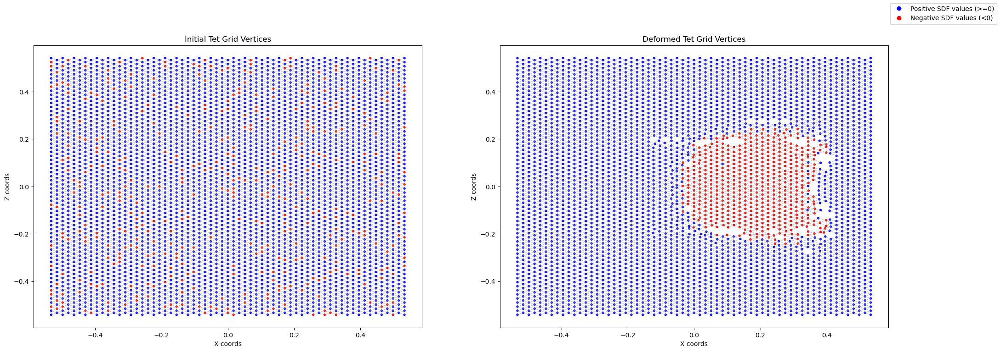

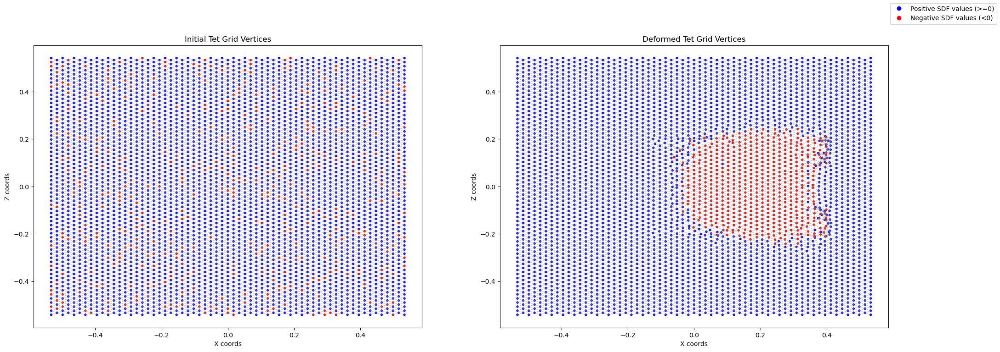

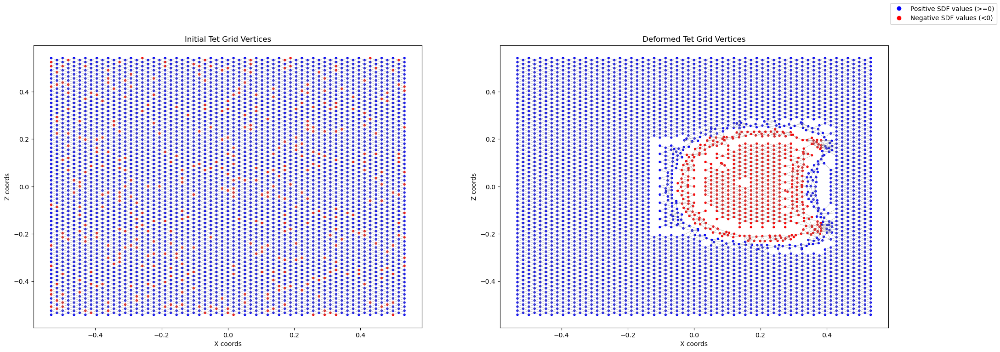

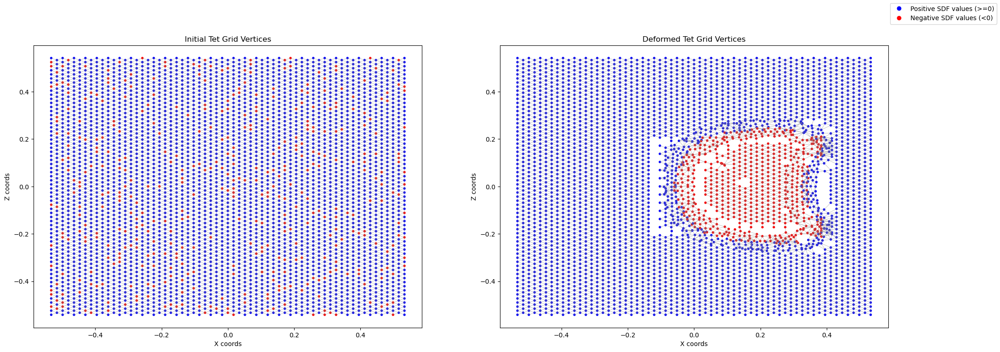

In [19]:
init_verts = geometry_init.verts.detach().cpu().numpy()
init_sdfs = geometry_init.sdf.detach().cpu().numpy()
init_edges = geometry_init.all_edges.detach().cpu().numpy()

verts_fir = geometry_first.get_deformed().detach().cpu().numpy()
# verts_fir_ = (geometry_first.verts + 2 / (geometry_first.grid_res * 2) \
#               * torch.tanh(geometry_first.deform) * geometry_first.deform_scale).detach().cpu().numpy()
sdfs_fir = geometry_first.sdf.detach().cpu().numpy()
edges_fir = geometry_first.all_edges.detach().cpu().numpy()

verts_sec = geometry_second.get_deformed().detach().cpu().numpy()
# verts_sec_ = (geometry_second.verts + 2 / (geometry_second.grid_res * 2) \
#               * torch.tanh(geometry_second.deform) * geometry_second.deform_scale).detach().cpu().numpy()
sdfs_sec = geometry_second.sdf.detach().cpu().numpy()
edges_sec = geometry_second.all_edges.detach().cpu().numpy()

height = np.sqrt(6) / 3 * (verts.unique()[1] - verts.unique()[0])
height = height.detach().cpu().numpy()
print("height: ", height)

visualize_projections(init_verts, init_sdfs, verts_fir, sdfs_fir, y_middle=0.02, y_range=height*0.95, edges=init_edges, edges_def=edges_fir)
# visualize_projections(init_verts, init_sdfs, verts_fir_, sdfs_fir, y_middle=0.02, y_range=height*0.95, edges=init_edges, edges_def=edges_fir)
visualize_projections(init_verts, init_sdfs, verts_fir, sdfs_fir, y_middle=0.02, y_range=0.01, edges=init_edges, edges_def=edges_fir)
# visualize_projections(init_verts, init_sdfs, verts_fir_, sdfs_fir, y_middle=0.02, y_range=0.01, edges=init_edges, edges_def=edges_fir)
visualize_projections(init_verts, init_sdfs, verts_sec, sdfs_sec, y_middle=0.02, y_range=height*0.95, edges=init_edges, edges_def=edges_sec)
# visualize_projections(init_verts, init_sdfs, verts_sec_, sdfs_sec, y_middle=0.02, y_range=height*0.95, edges=init_edges, edges_def=edges_sec)
visualize_projections(init_verts, init_sdfs, verts_sec, sdfs_sec, y_middle=0.02, y_range=0.01, edges=init_edges, edges_def=edges_sec)
# visualize_projections(init_verts, init_sdfs, verts_sec_, sdfs_sec, y_middle=0.02, y_range=0.01, edges=init_edges, edges_def=edges_sec)

## (ref) tetrahedron grids to 3D grids

In [20]:
# from tets_to_3dgrid.py
verts_unique = verts.unique().to(device)
dx = verts_unique[1] - verts_unique[0]
verts_desc = (torch.round((verts.to(device) - verts.to(device).min() / dx))).long()

values_list = (tet["sdf"].unsqueeze(-1), tet["deform"])

grid = torch.zeros(4, dmtet_grid, dmtet_grid, dmtet_grid, device=device).to(device)
with torch.no_grad():
    for k, values in enumerate(values_list):
        if k == 0:
            grid[k, verts_desc[:, 0], verts_desc[:, 1], verts_desc[:, 2]] = values.squeeze().to(device)
        else:
            grid[1:, verts_desc[:, 0], verts_desc[:, 1], verts_desc[:, 2]] = values.transpose(0, 1).to(device) # (3, 1)
grid.shape

torch.Size([4, 128, 128, 128])

In [21]:
verts_unique = verts.unique()
dx = verts_unique[1] - verts_unique[0]
verts_desc = (torch.round((verts - verts.min()) / dx)).long()
verts_desc.shape

torch.Size([253024, 3])

## Get the grids which contain iso-surfaces and their neighbors

In [22]:
print("geometry_first.get_deformed().shape: ", geometry_first.get_deformed().shape)
print("geometry_first.sdf.shape: ", geometry_first.sdf.shape)
print("geometry_first.indices.shape: ", geometry_first.indices.shape)

geometry_first.get_deformed().shape:  torch.Size([253024, 3])
geometry_first.sdf.shape:  torch.Size([253024])
geometry_first.indices.shape:  torch.Size([1387746, 4])


In [23]:
occ_sum = torch.sum((geometry_first.sdf > 0)[geometry_first.indices.reshape(-1)].reshape(-1, 4), -1)
valid_tets = (occ_sum > 0) & (occ_sum < 4)
valid_indices = geometry_first.indices[valid_tets]

In [24]:
print("valid_tets.shape: ", valid_tets.shape)
print("valid_indices.shape: ", valid_indices.shape)
print("torch.unique(valid_indices).shape: ", torch.unique(valid_indices).shape)

valid_tets.shape:  torch.Size([1387746])
valid_indices.shape:  torch.Size([34145, 4])
torch.unique(valid_indices).shape:  torch.Size([11728])


In [25]:
# important!!!
print("Tetrahedron ids which contain iso-surfaces: ", geometry_first.getValidTetIdx().shape)
print("Vertice ids of the tets which contain iso-srufaces: ", geometry_first.getValidVertsIdx().shape)
print(geometry_first.getValidVertsIdx())
valid_verts = geometry_first.get_deformed()[geometry_first.getValidVertsIdx()]
valid_sdfs = geometry_first.sdf[geometry_first.getValidVertsIdx()]

Tetrahedron ids which contain iso-surfaces:  torch.Size([44220])
Vertice ids of the tets which contain iso-srufaces:  torch.Size([11728])
tensor([ 45220,  45227,  45228,  ..., 222873, 222876, 222879], device='cuda:0')


number of valid vertices:  11728


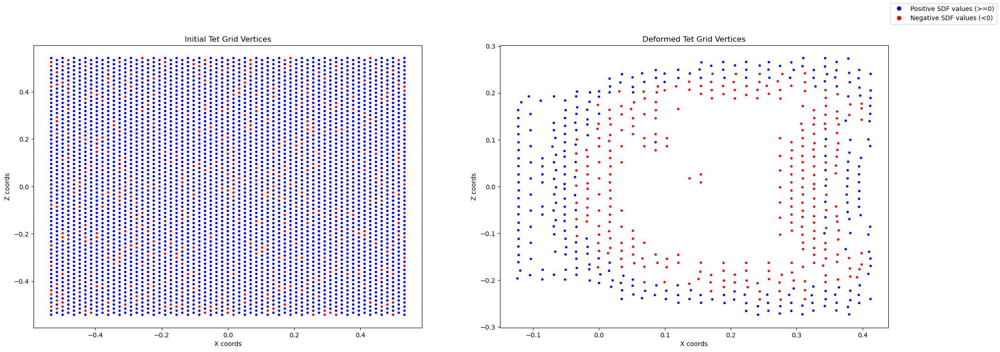

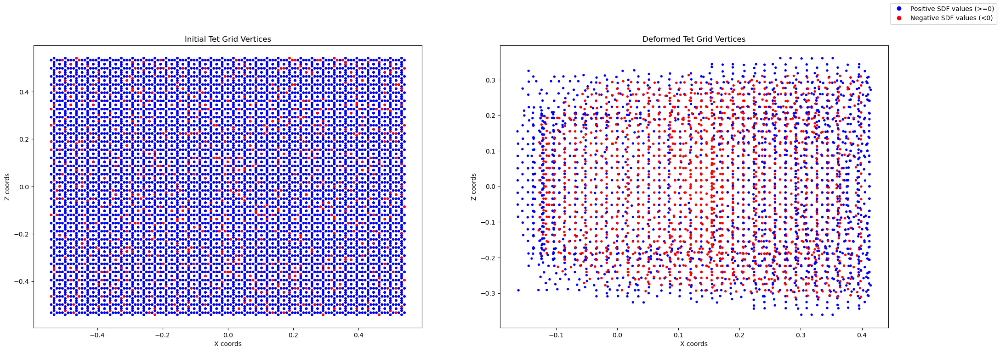

In [26]:
valid_verts_ = valid_verts.detach().cpu().numpy()
print("number of valid vertices: ", len(valid_verts))
valid_sdfs_ = valid_sdfs.detach().cpu().numpy()

visualize_projections(init_verts, init_sdfs, valid_verts_, valid_sdfs_, y_middle=0.02, y_range=height*0.95)
visualize_projections(init_verts, init_sdfs, valid_verts_, valid_sdfs_, y_middle=0.02, y_range=0.05)

### Sample more points with knn

In [27]:
from pytorch3d.ops import knn_points, knn_gather

"""
K-Nearest neighbors on point clouds.

Args:
    p1: Tensor of shape (N, P1, D) giving a batch of N point clouds, each
        containing up to P1 points of dimension D.
    p2: Tensor of shape (N, P2, D) giving a batch of N point clouds, each
        containing up to P2 points of dimension D.
    lengths1: LongTensor of shape (N,) of values in the range [0, P1], giving the
        length of each pointcloud in p1. Or None to indicate that every cloud has
        length P1.
    lengths2: LongTensor of shape (N,) of values in the range [0, P2], giving the
        length of each pointcloud in p2. Or None to indicate that every cloud has
        length P2.
    norm: Integer indicating the norm of the distance. Supports only 1 for L1, 2 for L2.
    K: Integer giving the number of nearest neighbors to return.
    version: Which KNN implementation to use in the backend. If version=-1,
        the correct implementation is selected based on the shapes of the inputs.
    return_nn: If set to True returns the K nearest neighbors in p2 for each point in p1.
    return_sorted: (bool) whether to return the nearest neighbors sorted in
        ascending order of distance.

Returns:
    dists: Tensor of shape (N, P1, K) giving the squared distances to
        the nearest neighbors. This is padded with zeros both where a cloud in p2
        has fewer than K points and where a cloud in p1 has fewer than P1 points.

    idx: LongTensor of shape (N, P1, K) giving the indices of the
        K nearest neighbors from points in p1 to points in p2.
        Concretely, if `p1_idx[n, i, k] = j` then `p2[n, j]` is the k-th nearest
        neighbors to `p1[n, i]` in `p2[n]`. This is padded with zeros both where a cloud
        in p2 has fewer than K points and where a cloud in p1 has fewer than P1
        points.

    nn: Tensor of shape (N, P1, K, D) giving the K nearest neighbors in p2 for
        each point in p1. Concretely, `p2_nn[n, i, k]` gives the k-th nearest neighbor
        for `p1[n, i]`. Returned if `return_nn` is True.
        The nearest neighbors are collected using `knn_gather`

        .. code-block::

            p2_nn = knn_gather(p2, p1_idx, lengths2)

        which is a helper function that allows indexing any tensor of shape (N, P2, U) with
        the indices `p1_idx` returned by `knn_points`. The output is a tensor
        of shape (N, P1, K, U).

"""

_, nearest_indices, _ = knn_points(valid_verts.unsqueeze(0), geometry_first.get_deformed().unsqueeze(0), K=5)
nearest_indices = nearest_indices.squeeze(0)
print(nearest_indices.shape)
neighbors = geometry_first.get_deformed()[nearest_indices.reshape(-1)].reshape(-1, 3)
neighbors_sdfs = geometry_first.sdf[nearest_indices.reshape(-1)]
print("neighbors.shape: ", neighbors.shape)
print("neighbors_sdfs.shape: ", neighbors_sdfs.shape)
neighbors_ = torch.cat((neighbors, neighbors_sdfs.unsqueeze(-1)), dim=1) # (N, 4)
valid_verts_ = torch.cat((valid_verts, valid_sdfs.unsqueeze(-1)), dim=1) # (M, 4)
combined_verts_ = torch.cat((valid_verts_, neighbors_), dim=0)
combined_verts_ = torch.unique(combined_verts_, dim=0)
combined_verts, combined_sdfs = combined_verts_[:, :3], combined_verts_[:, 3]
print("combined_verts.shape: ", combined_verts.shape)
print("combined_sdfs.shape: ", combined_sdfs.shape)

torch.Size([11728, 5])
neighbors.shape:  torch.Size([58640, 3])
neighbors_sdfs.shape:  torch.Size([58640])
combined_verts.shape:  torch.Size([17222, 3])
combined_sdfs.shape:  torch.Size([17222])


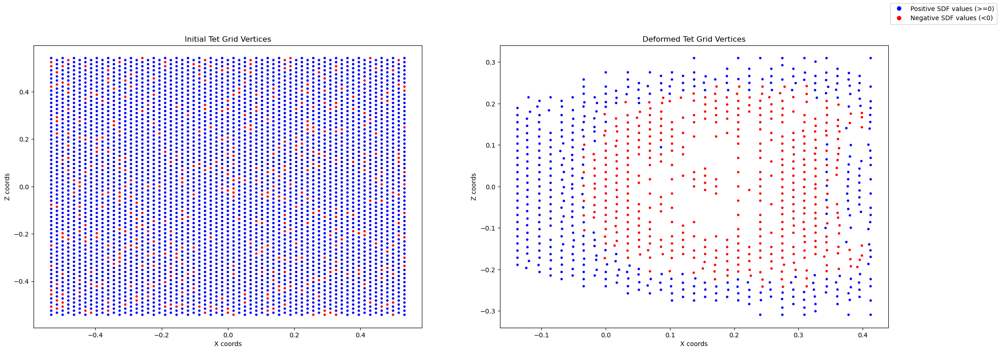

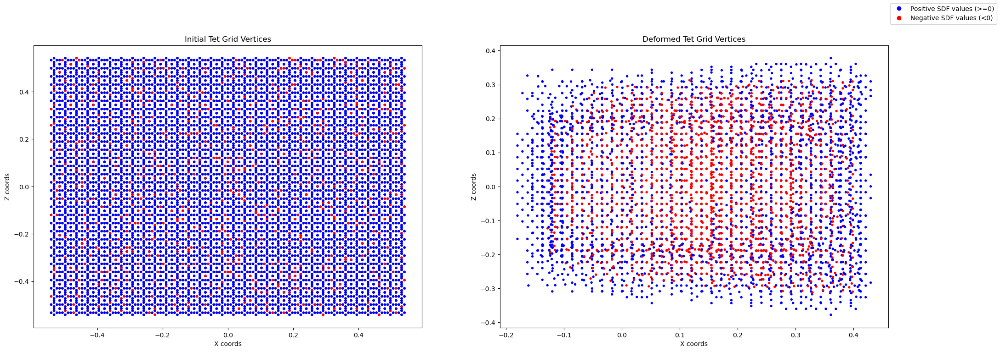

In [28]:
combined_verts_ = combined_verts.detach().cpu().numpy()
combined_sdfs_ = combined_sdfs.detach().cpu().numpy()

visualize_projections(init_verts, init_sdfs, combined_verts_, combined_sdfs_, y_middle=0.02, y_range=height*0.95)
visualize_projections(init_verts, init_sdfs, combined_verts_, combined_sdfs_, y_middle=0.02, y_range=0.05)

In [29]:
import trimesh

scene = trimesh.Scene()
pc = trimesh.PointCloud(combined_verts_)
pc.colors = [0, 0, 0, 0]
scene.add_geometry(pc)
scene.show()

### Sample more points with interpolation
- Originally, interpolation is used for DMTet to find iso-surface (for the grids that include different sign of sdf values)
- Here, we interpolate to get larger number of point clouds as inputs for next step

In [30]:
criteria = 160
for i in range(criteria*100, criteria*100 + 20):
    print(geometry_first.sdf[i])

tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')
tensor(0.0100, device='cuda:0')


In [31]:
print("Tetrahedron ids which contain iso-surfaces: ", geometry_first.getValidTetIdx().shape)
print("Vertice ids of the tets which contain iso-srufaces: ", geometry_first.getValidVertsIdx().shape)
geometry_first.indices.shape

Tetrahedron ids which contain iso-surfaces:  torch.Size([44220])
Vertice ids of the tets which contain iso-srufaces:  torch.Size([11728])


torch.Size([1387746, 4])

In [32]:
valid_tets = geometry_first.indices[geometry_first.getValidTetIdx()]
valid_verts = geometry_first.get_deformed()[geometry_first.getValidVertsIdx()]
valid_sdfs = geometry_first.sdf[geometry_first.getValidVertsIdx()]
print(valid_tets.shape)
print(valid_verts.shape)
print(valid_sdfs.shape)

torch.Size([44220, 4])
torch.Size([11728, 3])
torch.Size([11728])


In [51]:
# from marching tetrahera algorithm
@torch.no_grad()
def sort_edges(edges):
    order = (edges[:,0] > edges[:,1]).long()
    order = order.unsqueeze(dim=1)

    a = torch.gather(input=edges, index=order, dim=1)
    b = torch.gather(input=edges, index=1-order, dim=1)
    return torch.stack([a, b],-1)

@torch.no_grad()
def interpolate_valid_tets(num_interp_pts, verts, sdfs, valid_tets, device="cuda"):
    base_tet_edges = torch.tensor([0,1,0,2,0,3,1,2,1,3,2,3], dtype=torch.long, device=device)
    all_edges = sort_edges(valid_tets[:, base_tet_edges].reshape(-1, 2))
    unique_edges, idx_map = torch.unique(all_edges, dim=0, return_inverse=True)
    unique_edges = unique_edges.long()
    
    edges_to_interp = verts[unique_edges.reshape(-1)].reshape(-1, 2, 3)
    edges_to_interp_sdf = sdfs[unique_edges.reshape(-1)].reshape(-1, 2, 1)

    t_values = torch.linspace(0., 1., num_interp_pts + 2, device=device)[1:-1]
    t_values = t_values.reshape(1, -1, 1).repeat(edges_to_interp.shape[0], 1, 1)

    # v_{ab}^{(t)} = (1 - t) * v_a + t * v_b // s_{ab}^{(t)} = (1 - t) * s(v_a) + t * s(v_b)
    interp_pts = (1 - t_values) * edges_to_interp[:, 0, :].unsqueeze(1) + t_values * edges_to_interp[:, 1, :].unsqueeze(1)
    interp_sdfs = (1 - t_values) * edges_to_interp_sdf[:, 0, :].unsqueeze(1) + t_values * edges_to_interp_sdf[:, 1].unsqueeze(1)

    verts_and_sdfs = torch.unique(
        torch.cat([verts[unique_edges.reshape(-1)], sdfs[unique_edges.reshape(-1)].reshape(-1, 1)], dim=1),
        dim=0
    )
    interp_pts_and_sdfs = torch.cat([interp_pts.reshape(-1, 3), interp_sdfs.reshape(-1, 1)], dim=1)
    new_ = torch.cat([verts_and_sdfs, interp_pts_and_sdfs], dim=0)
    new_verts, new_sdfs = new_[:, :3], new_[:, 3]
    # new_verts = torch.cat([torch.unique(verts[unique_edges.reshape(-1)], dim=0),
    #                        interp_pts.reshape(-1, 3)], dim=0)
    # new_sdfs = torch.cat([torch.unique(sdfs[unique_edges.reshape(-1)], dim=0),
    #                       interp_sdfs.reshape(-1)], dim=0)
    return new_verts, new_sdfs

In [34]:
# with torch.no_grad():
#     base_tet_edges = torch.tensor([0,1,0,2,0,3,1,2,1,3,2,3], dtype=torch.long, device=device)
#     all_edges = sort_edges(valid_tets[:, base_tet_edges].reshape(-1, 2))
#     unique_edges, idx_map = torch.unique(all_edges, dim=0, return_inverse=True)
#     unique_edges = unique_edges.long()
    
#     edges_to_interp = valid_verts[unique_edges.reshape(-1)].reshape(-1, 2, 3)
#     edges_to_interp_sdf = valid_sdfs[unique_edges.reshape(-1)].reshape(-1, 2, 1)
#     # edges_to_interp_sdf[:, -1] *= -1

#     # denominator = edges_to_interp_sdf.sum(1, keepdim=True)
#     # edges_to_interp_sdf = torch.flip(edges_to_interp_sdf, [1]) / denominator

#     num_interp_pts = 3
#     t_values = torch.linspace(0., 1., num_interp_pts + 2, device=device)[1:-1]
#     print(t_values.shape)
#     t_values = t_values.reshape(1, -1, 1).repeat(edges_to_interp.shape[0], 1, 1)
#     print(t_values.shape)

#     # v_{ab}^{(t)} = (1 - t) * v_a + t * v_b // s_{ab}^{(t)} = (1 - t) * s(v_a) + t * s(v_b)
#     interp_pts = (1 - t_values) * edges_to_interp[:, 0, :].unsqueeze(1) + t_values * edges_to_interp[:, 1, :].unsqueeze(1)
#     interp_sdfs = (1 - t_values) * edges_to_interp_sdf[:, 0, :].unsqueeze(1) + t_values * edges_to_interp_sdf[:, 1].unsqueeze(1)
    
#     new_verts = torch.cat([valid_verts, interp_pts.reshape(-1, 3)], dim=0)
#     new_sdfs = torch.cat([valid_sdfs, interp_sdfs.reshape(-1)], dim=0)
#     print(new_verts.shape)
#     print(new_sdfs.shape)

torch.Size([11728, 3])
torch.Size([11728])
torch.Size([182950, 3])
torch.Size([182950])


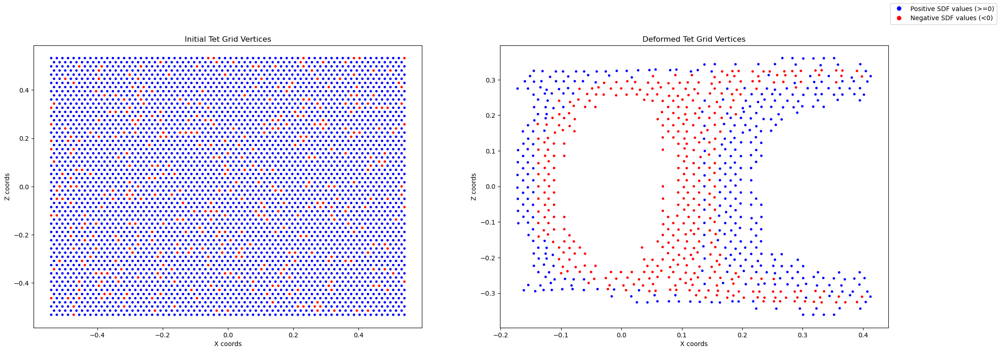

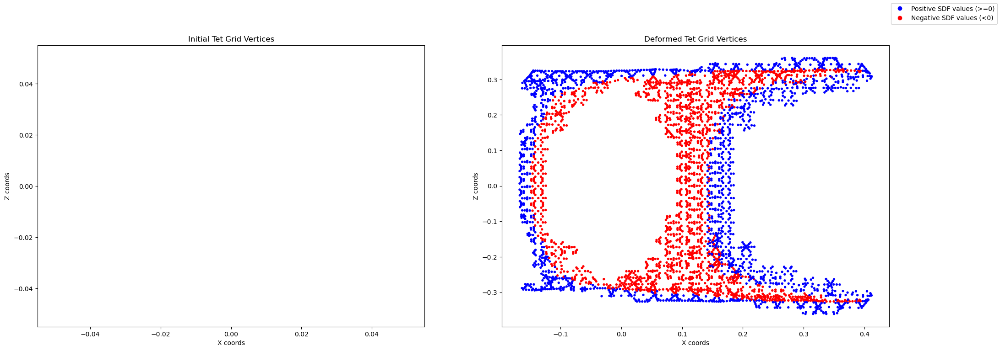

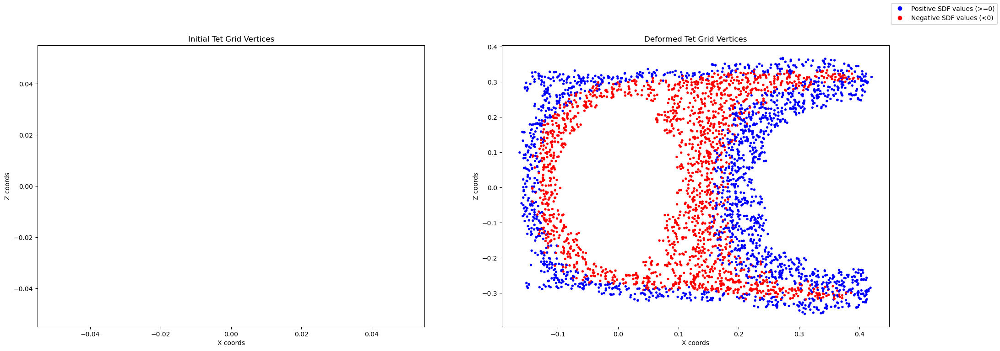

In [59]:
valid_tets = geometry_first.indices[geometry_first.getValidTetIdx()]
new_verts, new_sdfs = interpolate_valid_tets(3, geometry_first.get_deformed(), geometry_first.sdf, valid_tets)

valid_verts_ = valid_verts.detach().cpu().numpy()
valid_sdfs_ = valid_sdfs.detach().cpu().numpy()
print(valid_verts.shape)
print(valid_sdfs.shape)

new_verts_ = new_verts.detach().cpu().numpy()
new_sdfs_ = new_sdfs.detach().cpu().numpy()
print(new_verts.shape)
print(new_sdfs.shape)

eps = 1.0e-2

visualize_projections(init_verts, init_sdfs, valid_verts_, valid_sdfs_, y_middle=0.02, y_range=height*0.95)
visualize_projections(init_verts, init_sdfs, new_verts_, new_sdfs_, y_middle=0.02, y_range=height*0.95/3)
visualize_projections(init_verts, init_sdfs, (new_verts + torch.rand_like(new_verts) * eps).detach().cpu().numpy(),
                      (new_sdfs + torch.rand_like(new_sdfs) * eps).detach().cpu().numpy(),
                      y_middle=0.02, y_range=height*0.95/3)

In [52]:
scene = trimesh.Scene()
pc = trimesh.PointCloud(new_verts_)
pc.colors = [0, 0, 0, 0]
scene.add_geometry(pc)
scene.show()

In [53]:
print(new_verts_.shape)
print(new_sdfs_.shape)

(182950, 3)
(182950,)


In [54]:
scene = trimesh.Scene()
pc = trimesh.PointCloud((new_verts + torch.rand_like(new_verts) * eps).detach().cpu().numpy())
pc.colors = [0, 0, 0, 0]
scene.add_geometry(pc)
scene.show()

# Dataset with Sampled PCs from Surfaces (No color)

In [ ]:
data_path = 

## DMTet Positional Encoding from kaolin library

In [64]:
# from https://github.com/NVIDIAGameWorks/kaolin/blob/master/examples/tutorial/dmtet_network.py
import torch
from torch import nn

# MLP + Positional Encoding
class DMTetDecoder(nn.Module):
    def __init__(self, dmtet_embed_kwargs, input_dims=3, internal_dims=128, output_dims=4, hidden=5, multires=2):
        super().__init__()
        self.embed_fn = None
        if multires > 0:
            # embedder_obj = Embedder(**dmtet_embed_kwargs)
            # self.embed_fn = lambda x, eo=embedder_obj : eo.embed(x)
            # input_dims = embedder_obj.out_dim
            embedder = Embedder(**dmtet_embed_kwargs)
            self.embed_fn, input_dims = embedder.get_embedder()

        net = (nn.Linear(input_dims, internal_dims, bias=False), nn.ReLU())
        for i in range(hidden-1):
            net += (nn.Linear(internal_dims, internal_dims, bias=False), nn.ReLU())
        net += (nn.Linear(internal_dims, output_dims, bias=False),)
        self.net = nn.Sequential(*net)

    def forward(self, p):
        if self.embed_fn is not None:
            print(p.shape)
            p = self.embed_fn(p)
            print(p.shape)
        return self.net(p)

    def pre_train_sphere(self, iter):
        print("Initialize SDF to sphere")
        loss_fn = nn.MSELoss()
        optimizer = torch.optim.Adam(list(self.parameters()), lr=1e-4)

        for i in range(iter):
            p = torch.rand((1024, 3), device="cuda") - 0.5
            ref_value = torch.sqrt((p**2).sum(-1)) - 0.3
            output = self(p)
            loss = loss_fn(output[..., 0], ref_value)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        print("Pre-trained MLP", loss.item())

# Positional Encoding from https://github.com/yenchenlin/nerf-pytorch/blob/1f064835d2cca26e4df2d7d130daa39a8cee1795/run_nerf_helpers.py
class Embedder:
    def __init__(self, max_freq=1, num_freqs=2, input_dims=3, include_input=True, log_sampling=True, periodic_fns=[torch.sin, torch.cos]):
        self.max_freq = max_freq # max_freq_log2 = multires-1 (1?)
        self.num_freqs = num_freqs # num_freqs = multires (2?)
        self.input_dims = input_dims
        self.include_input = include_input
        self.log_sampling = log_sampling
        self.periodic_fns = periodic_fns
        
        embed_fns = []
        d = input_dims
        out_dim = 0
        if include_input:
            embed_fns.append(lambda x : x)
            out_dim += d

        if log_sampling:
            freq_bands = 2.**torch.linspace(0., max_freq, steps=num_freqs)
        else:
            freq_bands = torch.linspace(2.**0, 2.**max_freq, steps=num_freqs)

        for freq in freq_bands:
            for p_fn in periodic_fns:
                embed_fns.append(lambda x, p_fn=p_fn, freq=freq : p_fn(x * freq))
                out_dim += d

        self.embed_fns = embed_fns
        self.out_dim = out_dim

    def embed(self, inputs):
        return torch.cat([fn(inputs) for fn in self.embed_fns], -1)

    def get_embedder(self):
        embed = lambda x, : self.embed(x)
        return embed, self.out_dim

In [80]:
multires = 2
dmtet_embed_kwargs = {
    "include_input": True,
    "input_dims": 3,
    "max_freq": multires-1,
    "num_freqs": multires,
    "log_sampling": True,
    "periodic_fns": [torch.sin, torch.cos]
}

embed_fn, input_dims = Embedder(**dmtet_embed_kwargs).get_embedder()

In [81]:
input_dims

15

In [79]:
p = torch.rand((8, 1024, 3))
# embed_fn(p).shape
Embedder(**dmtet_embed_kwargs).embed(p).shape

torch.Size([8, 1024, 9])

In [77]:
torch.linspace(0., 0, steps=1)

tensor([0.])